# Python for Spatial Analysis
### Second part of the module of GG3209 Spatial Analysis with GIS.
---
# Notebook to practice GeoPandas - Exercises
---
Dr Fernando Benitez -  University of St Andrews - School of Geography and Sustainable Development

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Load the required data in your Drive

Get the folder called **london_data** in **Moodle** and upload it in your Google Drive., Make sure you mount the Drive (if you dont recall how to do that, check the previous guide) in this Notebook so you can access the data in the following tasks.

# 2. Practicing GeoPandas

Once you have mount the Drive and locate the path of the folder **london_data** you will find a shapefile representing the LSOA polygons with the population from the latest census 2021. E.g **data\london_data\Census20_LSOA.shp** For example, the column "Pop20" contains population counts for each LSOA area. For this excersice you need to create and write the code for the following challenges.

Create Text and Code cells to describe clearly the following challenges.

- Read the **Census20_LSOA.shp** layer into a GeoDataFrame.
- Subset the following columns (plus the geometry!):
    
    * LSOA11CD --> LSOA area code
    * LSOA11NM --> LSOA area name
    * LSOA11NMW --> LSOA bigger area
    * Pop20 -->  Population counts

- What is the Coordinate Reference System of the layer?

- How many features does the layer contain? Write an expression that returns the result as int.

- The values in the "LSOA11CD" column (code area ID) should all be unique. How can you make sure? Either use one of the methods we learned earlier, or search online (e.g., google “pandas check for duplicates”).

- Plot the layer using the **.plot** method

- Plot the layer using the **.explorer** method

- Subset just the LSOA areas with Pop20 counts greater than 1500.

- Plot the resulting subset, using symbology according to total population size, i.e., the "Pop_Total" column, and using a sequentual color map such as "Reds".

- How many areas are there with the requested population? (hint: shape)

- What is the total population of the subset layer? (hint: sum)

Read the Census20_LSOA.shp layer into a GeoDataFrame.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
!pip install mapclassify
!pip install rasterio
import geopandas as gpd

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 81.2 MB/s eta 0:00:00


In [ ]:
london_data = gpd.read_file('/content/drive/MyDrive/Colab/data/london_data/london_data/Census20_LSOA.shp') #1

In [ ]:
london_data.head() #get column names

,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,GlobalID,MERGE_SRC,Shape_Leng,Shape_Area,LSOA_Code,LSOA_Name,Pop20,ObjectID,geometry
0,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,133324.978691,2291.187925,e87faa35-c559-4230-93be-8484ab490f70,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2291.187925,133324.978700,E01000001,City of London 001A,1749.0,28010,"POLYGON ((532105.092 182011.23, 532162.491 181..."
1,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,226210.015953,2488.086900,f0e3338a-e889-49be-8ca4-c7f2de90afd6,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2488.086900,226210.015930,E01000002,City of London 001B,1678.0,28011,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,57285.328705,1142.242230,a3512b47-41ae-4703-8264-c7cc44db1b37,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1142.242230,57285.328700,E01000003,City of London 001C,1900.0,28012,"POLYGON ((532135.138 182198.131, 532158.25 182..."
3,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,190747.438499,2167.872156,b62f5c70-737d-4936-9c85-eef139fce72f,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2167.872156,190747.438514,E01000005,City of London 001E,2181.0,28013,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,144195.364548,1935.412725,f74c0183-63f6-4468-b58d-577339257dea,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1935.412725,144195.364528,E01000006,Barking and Dagenham 016A,2117.0,28016,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [ ]:
subset_london = london_data[["LSOA11CD","LSOA11CD","LSOA11CD","Pop20"]]#2
subset_london.head()

,LSOA11CD,LSOA11CD,LSOA11CD,Pop20
0,E01000001,E01000001,E01000001,1749.0
1,E01000002,E01000002,E01000002,1678.0
2,E01000003,E01000003,E01000003,1900.0
3,E01000005,E01000005,E01000005,2181.0
4,E01000006,E01000006,E01000006,2117.0


In [ ]:
print(london_data.crs) #3

EPSG:27700


In [ ]:
print(london_data.shape[0]) #4

3920


In [ ]:
london_data['LSOA11CD'].duplicated(keep='last') #5

,LSOA11CD
0,False
1,False
2,False
3,False
4,False
...,...
3915,False
3916,False
3917,False
3918,False


<Axes: >

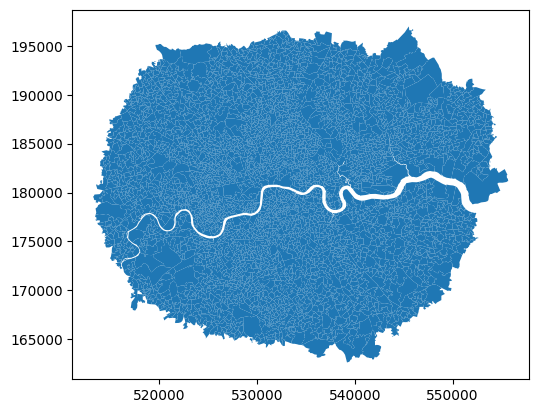

In [ ]:
london_data.plot() #6

In [ ]:
london_gdf=gpd.read_file('/content/drive/MyDrive/Colab/data/london_data/london_data/Census20_LSOA.shp')
london_gdf.explore(column='Pop20', cmap='RdYlBu', scheme='Quantiles', k=7) #7

Subset just the LSOA areas with Pop20 counts greater than 1500.

Plot the resulting subset, using symbology according to total population size, i.e., the "Pop_Total" column, and using a sequentual color map such as "Reds".

How many areas are there with the requested population? (hint: shape)

What is the total population of the subset layer? (hint: sum)

<Axes: >

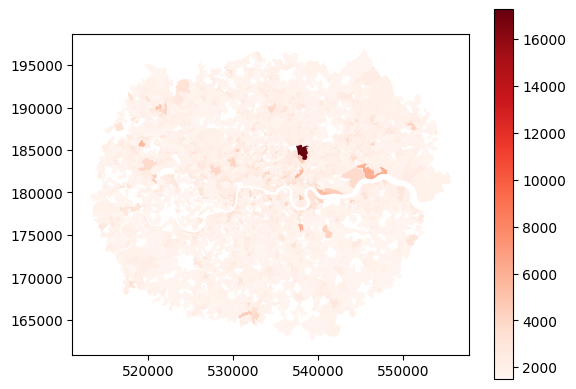

In [ ]:
LSOA_Pop = london_data[london_data['Pop20'] > 1500] #8
LSOA_Pop.plot(column='Pop20', cmap='Reds', legend=True)#9

In [ ]:
reqpop = LSOA_Pop.shape[0] #10
print("There are", reqpop, "LSOA areas with the requested population.")

There are 3361 LSOA areas with the requested population.


In [ ]:
totalpop = LSOA_Pop['Pop20'].sum()
print("There are", totalpop, "people living in the subset layer.") #11

There are 6587889.0 people living in the subset layer.


# 3. Practicing Rasterio

Import rasterio under the alias `rio`.


In [ ]:
import rasterio as rio

In [ ]:
tif = rio.open('/content/drive/MyDrive/Colab/data/Clipped_Raster.tif')
print(tif.name)
print(tif.count)
print(tif.bounds)
print(tif.crs)

/content/drive/MyDrive/Colab/data/Clipped_Raster.tif
1
BoundingBox(left=532627.5, bottom=5221222.5, right=639232.5, top=5289412.5)
EPSG:32610


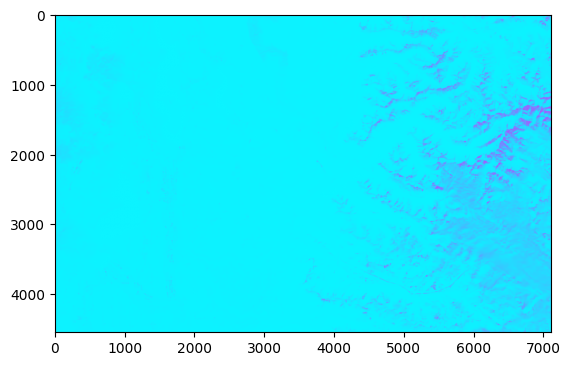

In [ ]:
plt.imshow(tif.read(1),cmap='cool')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 44.6 MB/s eta 0:00:00


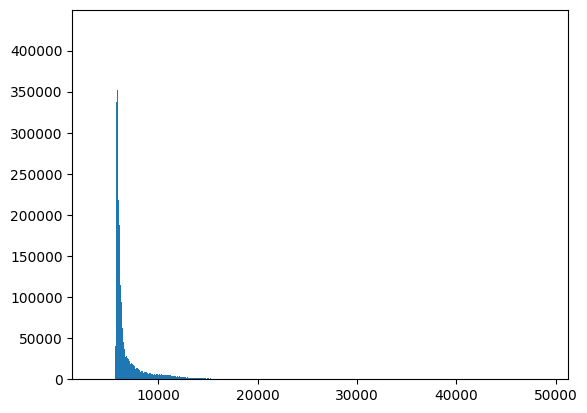

In [ ]:
!pip install earthpy
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import earthpy.plot as ep


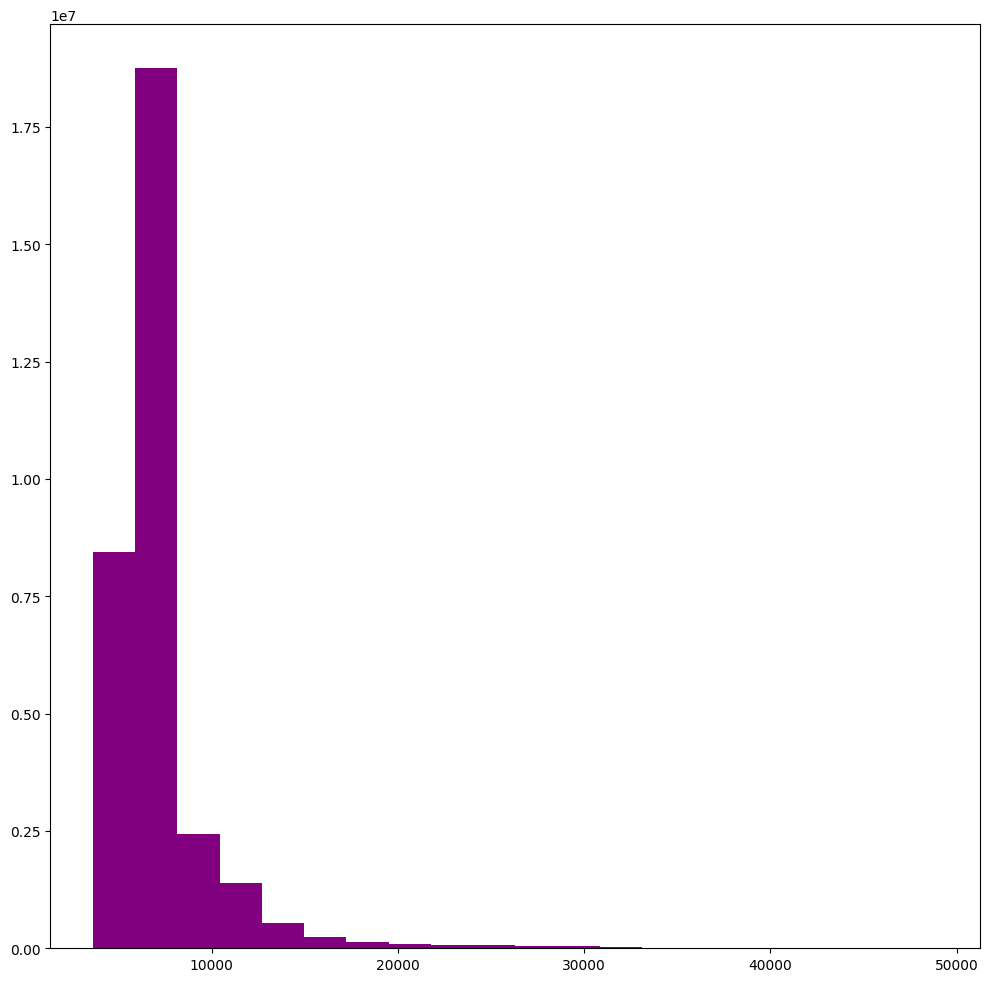

In [ ]:
ep.hist(tif.read(1))
plt.show()

In [ ]:
ep.plot_rgb(tif,
            rgb=[3, 2, 1],
            stretch=True,
            str_clip=10)
plt.show()

ValueError: Input needs to be 3 dimensions and in rasterio order with bands first

A false color band assignment didn't work because the given raster only has 1 band.

Download the following raster image, and then write the required code to accomplish the following challenges.

You need to download the Zip file containing the raster (TIFF file) and then Unzipped and upload it to your Google Drive or Jupyter Notebook session, the later remove the file once the session is close.

https://uostandrews.maps.arcgis.com/home/item.html?id=d91890cc59d74b97986591f532410cf8

Create Text and Code cells to clearly describe the following challenges:

- Read the file as a rasterio dataset
- What is the CRS of the dataset?
- What is the raster extent (bounds) of the dataset in projected coordinates?
- How many bands are there in this dataset?
- Create a plot of the image
- Create a Histograms from the raster
- Using EarthPy create a plot of false color (if you have an issue whith this, please describe the potential cause)


# Well done!

If you have finished **Python_DataViz, Python_GeoPandas_initial_guide and this notebook** then you have finished.